&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
[Next step: Evaluate detection model](./precision-accuracy-curves.ipynb)

# Train ungulate detection model
This notebook trains the detection model for the Kenyan ungulates example. 

As long as the 'local-paths.json' file has correct values for your local computer, this notebook mostly doesn't need to be modified to train the kenyan ungulates model. The only required changes are based on the specs of the computer being used. Specifically:

- cfg.DATALOADER.NUM_WORKERS
    - This defines the number of parrallel workers used as part of the data loading process.
    - This should be set to a value less than the number of cores in the computer being used
    
- cfg.SOLVER.IMS_PER_BATCH
    - This defines the number of images used in each training iteration. 
    - The larger batch sizes require more GPU memory. 
    - The batch size should generally be the largest value that doesn't cause memory errors.

In [1]:
import os
import random

import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import yaml

import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
import detectron2.utils.comm as comm
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

from detectron2.data import build_detection_train_loader
from detectron2.data import build_detection_test_loader

ungulates_root = os.path.dirname(os.path.dirname(os.getcwd()))
local_paths_file = os.path.join(ungulates_root, 'local-paths.json')
with open(local_paths_file, "r") as json_file:
    local_paths = json.load(json_file)

import sys
sys.path.append(local_paths['overhead_functions_path'])
from print_instances_class_histogram import print_instances_class_histogram

sys.path.append(
    os.path.join(local_paths['overhead_functions_path'],
                 "detectron2_classes"
                )
)
from DetectionDatasetMapper import DetectionDatasetMapper
from DetectionTrainer import DetectionTrainer

In [2]:
detectron2.__version__

'0.2.1'

In [3]:
# Local folder with annotated images and subfolder containing train.json
# and val.json files 
annotations_folder = local_paths['annotations_folder'] 
# This the name of the subfolder that contains the annotation .jsons
annotation_set_name = "annotations-clean-name-pruned"

In [4]:
# These are the specific training and validation .json files
train_json = os.path.join(annotations_folder, annotation_set_name, 'train.json') 
val_json = os.path.join(annotations_folder, annotation_set_name, 'val.json')

register_coco_instances("train", {}, train_json, annotations_folder)
register_coco_instances("val", {}, val_json, annotations_folder)

In [5]:
train_metadata = MetadataCatalog.get("train")
train_dicts = DatasetCatalog.get("train")
val_dicts = DatasetCatalog.get("val")

### Display some stats about the training and validation data being used

In [6]:
num_train_images = len(train_dicts)
num_val_images = len(val_dicts)
print(f"{num_train_images} training images \n"
      + f"{num_val_images} validation images")

train_metadata = MetadataCatalog.get("train")
print(f"Annotated classes: {train_metadata.get('thing_classes')}")

1340 training images 
286 validation images
Annotated classes: ['zebra', 'gazelle', 'wbuck', 'buffalo', 'other']


In [7]:
# Print specific number of annotations for each class in training and validation set loaded
print("\nTrain frames:")
print_instances_class_histogram(train_dicts, train_metadata.get("thing_classes"), num_frames=True)
print("\nTrain annotations:")
print_instances_class_histogram(train_dicts, train_metadata.get("thing_classes"), num_frames=False)
print("\nValidation frames:")
print_instances_class_histogram(val_dicts, train_metadata.get("thing_classes"), num_frames=True)
print("\nValidation annotations:")
print_instances_class_histogram(val_dicts, train_metadata.get("thing_classes"), num_frames=False)


Train frames:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   zebra    | 1007         |  gazelle   | 378          |   wbuck    | 63           |
|  buffalo   | 192          |   other    | 172          |            |              |
|   total    | 1812         |            |              |            |              |

Train annotations:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   zebra    | 14315        |  gazelle   | 4830         |   wbuck    | 498          |
|  buffalo   | 6192         |   other    | 854          |            |              |
|   total    | 26689        |            |              |            |              |

Validation frames:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |

### Define model and training specifics

Except as noted at the top of this notebook, these values shouldn't need to be changed to train the model with the example kenyan ungulate annotated data. For other applications, some values, like cfg.MODEL.ROI_HEADS.NUM_CLASSES must be modified to reflect the number of classes in the training set, while others, like augmentation hyper-parameters (e.g. cfg.INPUT.CONTRAST_RANGE) aren't required to change but other values may give better results depending on the actual images being used. 

In [8]:
name = 'full-resolution-model'

cfg = get_cfg()
cfg.merge_from_file(
    os.path.join(local_paths["detectron_path"],
                 "configs", "COCO-Detection",
                 "faster_rcnn_R_50_FPN_3x.yaml")
)

cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("val",)
# CHANGE BASED ON THE NUMBER OF CORES ON COMPUTER
cfg.DATALOADER.NUM_WORKERS = 6
cfg.DATALOADER.ASPECT_RATIO_GROUPING = False

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
)

# Change batch size based on amount of memory in GPU
# (Make the number smaller if getting GPU memory errors)
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.0019
# Maximum number of times to cycle through training data while training
max_epochs = 800
iter_per_epoch = num_train_images // cfg.SOLVER.IMS_PER_BATCH
cfg.SOLVER.MAX_ITER = max_epochs * iter_per_epoch
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupValLossLR"
cfg.SOLVER.PATIENCE = 2
# How often to save a checkpoint while training
# 0 to save best model based on minimum val loss
cfg.SOLVER.CHECKPOINT_PERIOD = 0 

cfg.SOLVER.WARMUP_ITERS = 5 
# This number should be bigger than the number
# of expected objects in each frame
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (256)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(train_metadata.get("thing_classes"))
# How often to check model performance on the validation set
# if iter_per_epoch then every epoch
cfg.TEST.EVAL_PERIOD = iter_per_epoch * 10 # eval every five epochs
# Should be larger than max number of expected objects in image
cfg.TEST.DETECTIONS_PER_IMAGE = 200

cfg.INPUT.MIN_SIZE_TRAIN = (0)
cfg.INPUT.MIN_SIZE_TEST = (0)
cfg.INPUT.MAX_SIZE_TRAIN = (4100)
cfg.INPUT.MAX_SIZE_TEST = (4100)

# Set the data augementation regime
# These values are effective for our ungulate images, but should be explored 
# when training models with other images
cfg.INPUT.CROP.ENABLED = True
cfg.INPUT.CROP.TYPE = "absolute"
cfg.INPUT.CROP.SIZE = (720.0, 1280.0)
cfg.INPUT.RESIZE = False
cfg.INPUT.RESIZE_SHAPE = (720, 2048)
cfg.INPUT.VER_FLIP = True
cfg.INPUT.HOR_FLIP = True
cfg.INPUT.AUG_ON_TEST = False
cfg.INPUT.CONTRAST = True
cfg.INPUT.CONTRAST_RANGE = (.5, 1.5)
cfg.INPUT.BRIGHTNESS = True
cfg.INPUT.BRIGHTNESS_RANGE = (.3, 2.0)
cfg.INPUT.SATURATION = True
cfg.INPUT.SATURATION_RANGE = (.7, 1.4)


output_name = '{}_maxiter-{}_lr-{}_detectPerIm-{}_minsize-{}_batchsize-{}'.format(
    name, cfg.SOLVER.MAX_ITER, cfg.SOLVER.BASE_LR, cfg.TEST.DETECTIONS_PER_IMAGE, 
    np.min(cfg.INPUT.MIN_SIZE_TRAIN), cfg.SOLVER.IMS_PER_BATCH
)
cfg.OUTPUT_DIR = os.path.join(cfg.OUTPUT_DIR, output_name)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Save the config file for future reference
yaml_file = os.path.join(cfg.OUTPUT_DIR, "config.yaml")
with open(yaml_file, 'w') as file:
    file.write(cfg.dump())

### Visualize some of the training images with augmentation and annotations

This is helpful to check to make sure what we're feeding into the model is what we think we're feeding into it after preprocessing

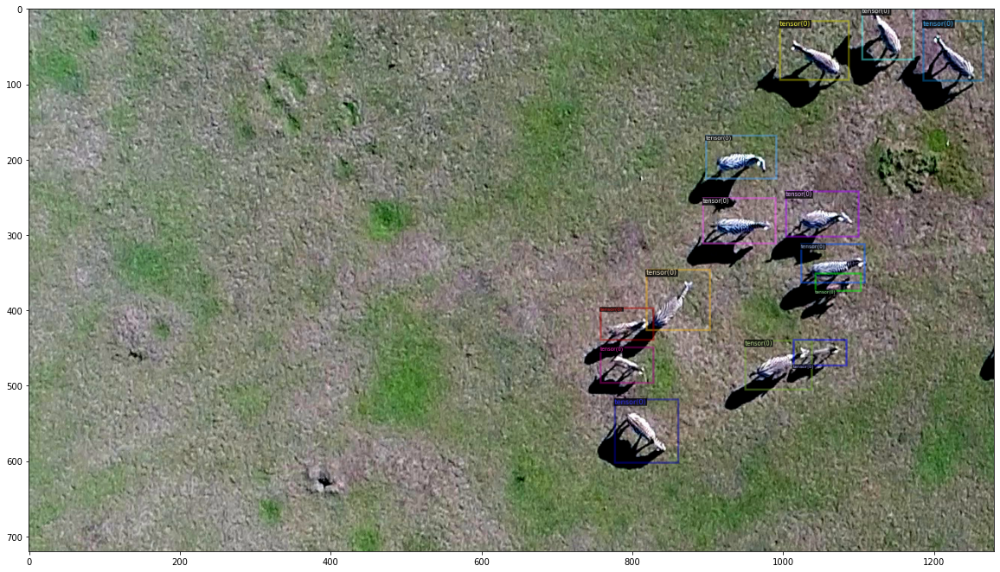

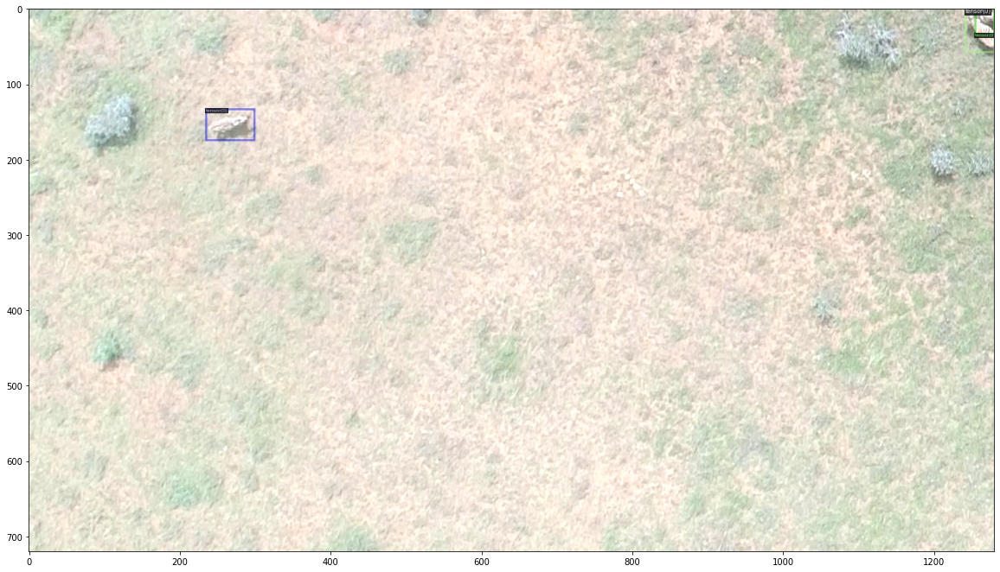

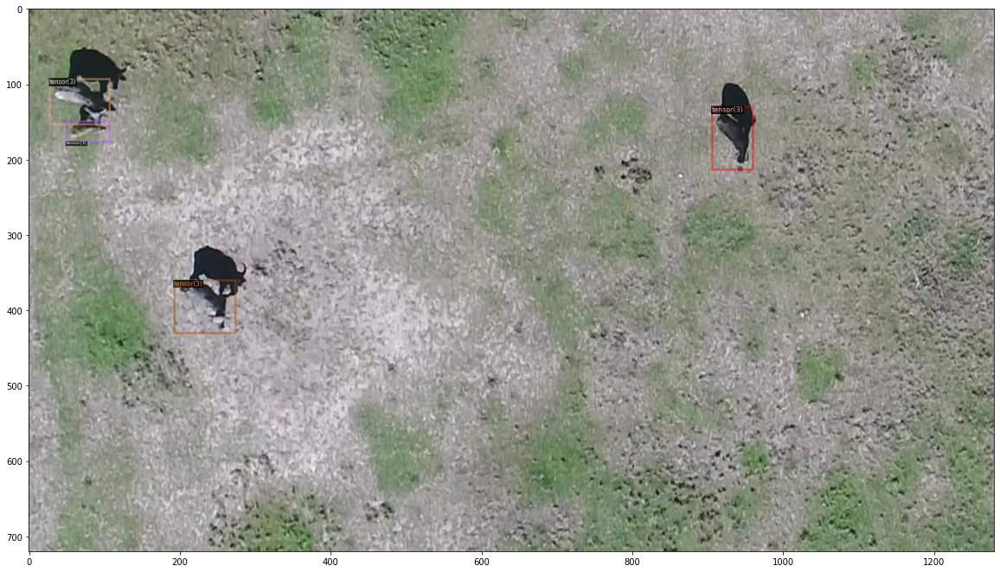

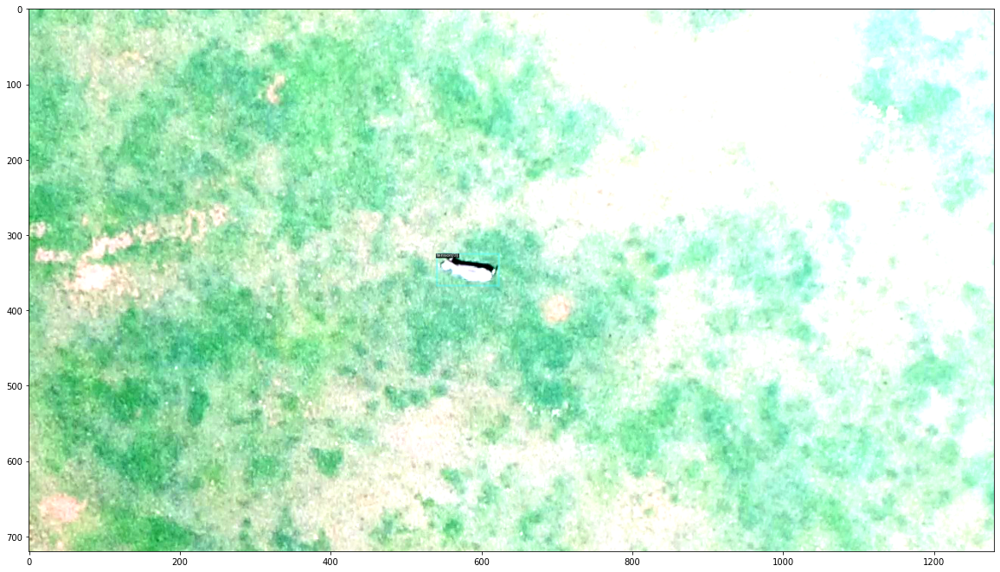

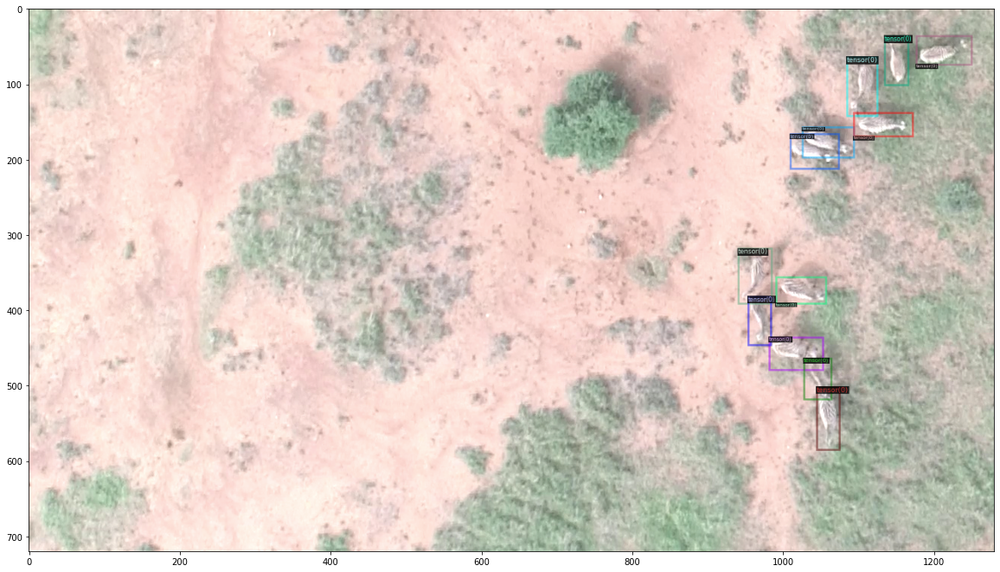

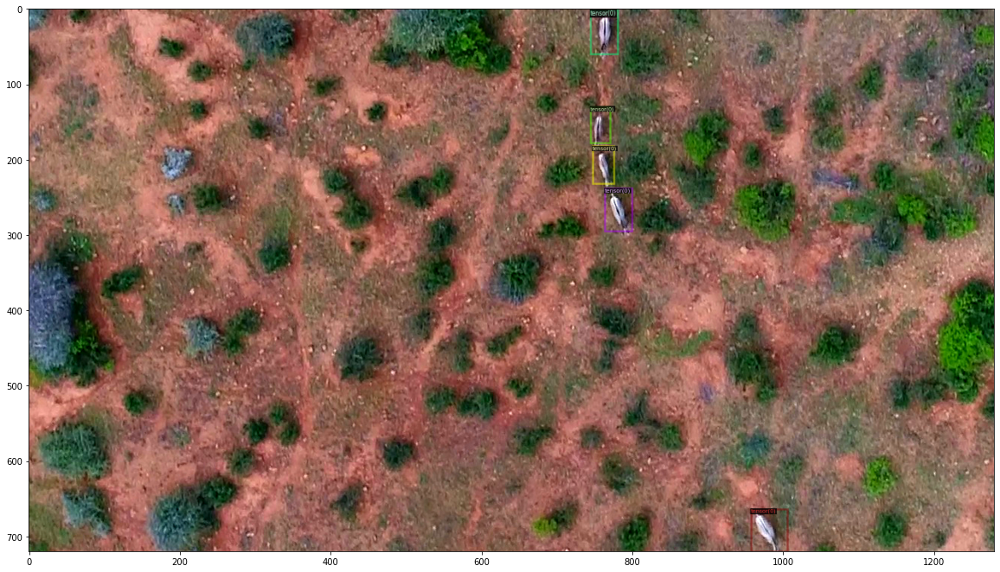

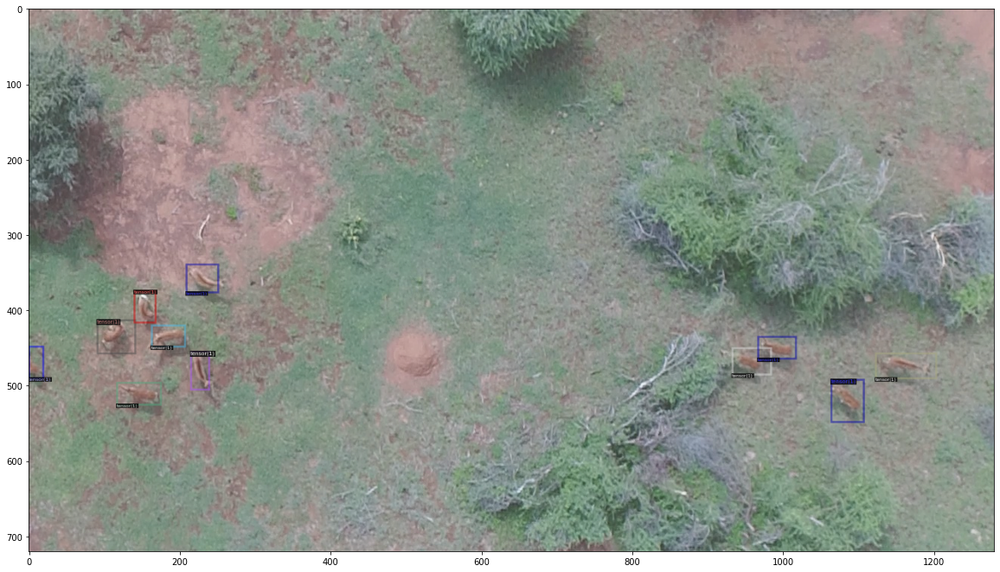

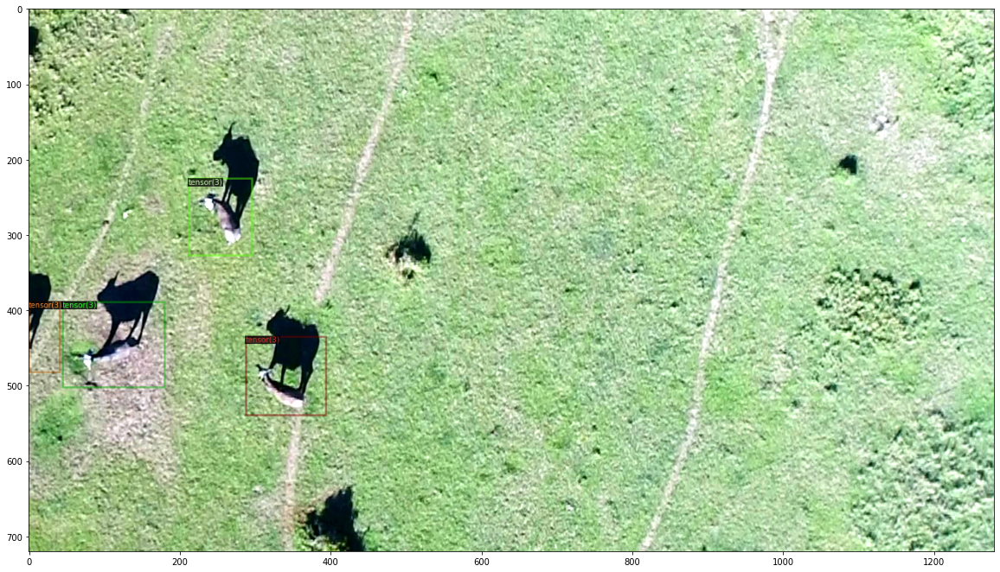

In [9]:
import matplotlib.pyplot as plt

show_images = True
show_test_images = False
if show_images:
    
    mapper = DetectionDatasetMapper(cfg)
    if show_test_images:
        loader = build_detection_test_loader(cfg, cfg.DATASETS.TEST[0])
    else:
        loader = build_detection_train_loader(cfg, mapper=mapper)
    loader_iter = iter(loader)
    for _ in range(1):
        batch = next(loader_iter)
        for im_dict in batch:
            image = im_dict['image'].numpy()
            image = np.transpose(image, [1, 2, 0])
            plt.figure(figsize=(20,20))
            visualizer = Visualizer(image[:, :, ::-1], 
                                    metadata=train_metadata, 
                                    scale=1.0)

            vis = visualizer.overlay_instances(
                boxes=im_dict['instances'].get('gt_boxes'), 
                labels=im_dict['instances'].get('gt_classes'),
                alpha=1.0)

            plt.imshow(vis.get_image())

### Initialize the actual model trainer based on the config file

In [9]:
trainer = DetectionTrainer(cfg)

[03/30 17:54:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

### Train the model

In [11]:
trainer.resume_or_load(resume=False)
trainer.train()

### After the model has trained, visulize the model output for three random example images in the validation set

In [1]:
# Check training quality after finished
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "best-model-config-iter-896-loss-0.8034359399295811.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("val", )
predictor = DefaultPredictor(cfg)

for d in random.sample(val_dicts, 3):
# for d in train_dicts:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata,
                   scale=0.8,
                   
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(20,20))
    plt.imshow(v.get_image()[:, :, ::])

&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
&emsp;&emsp;&emsp;&emsp;&emsp;
[Next step: Evaluate detection model](./precision-accuracy-curves.ipynb)
